In [1]:
import pandas as pd
import seaborn as sns
pd.options.display.max_rows = 10

In [2]:
# read the gdp data from gdp.csv
gdp = pd.read_csv(r'C:\Users\liliz\OneDrive\Desktop\AI and ML\Berkeley Certificate\Module 4\video_assets_starter\DataSets\gdp.csv')
gdp["gdp"] = gdp["GDP (constant 2010 US$)"] / 1_000_000_000

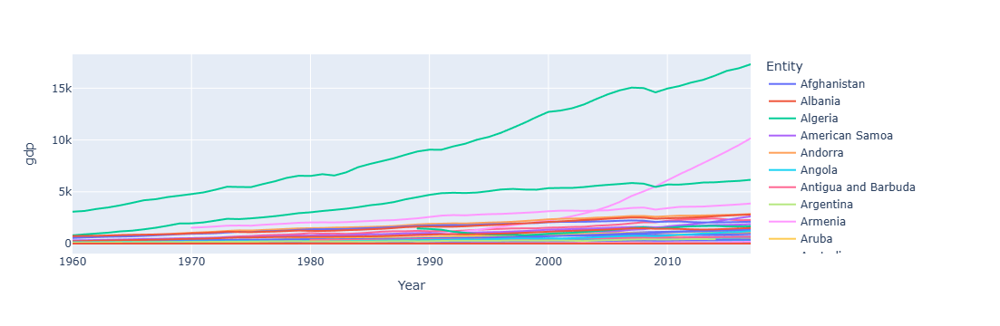

In [3]:
import plotly.express as px
px.line(gdp, x = "Year", y = "gdp", color = "Entity")

In [4]:
# Read in population.csv
pop = pd.read_csv(r'C:\Users\liliz\OneDrive\Desktop\AI and ML\Berkeley Certificate\Module 4\video_assets_starter\DataSets\population.csv')

In [5]:
pop

,Entity,Code,Year,"Total population (Gapminder, HYDE & UN)"
0,Afghanistan,AFG,1800,3280000
1,Afghanistan,AFG,1801,3280000
2,Afghanistan,AFG,1802,3280000
3,Afghanistan,AFG,1803,3280000
4,Afghanistan,AFG,1804,3280000
...,...,...,...,...
46878,Zimbabwe,ZWE,2015,13815000
46879,Zimbabwe,ZWE,2016,14030000
46880,Zimbabwe,ZWE,2017,14237000
46881,Zimbabwe,ZWE,2018,14439000


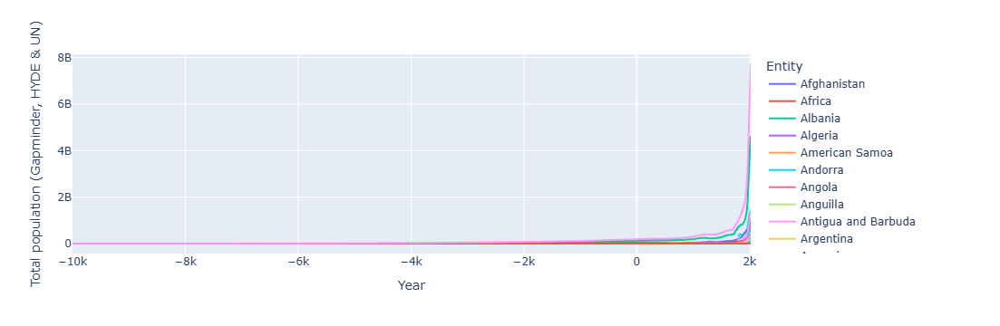

In [6]:
# Try plotting data, evently narrowing to recent history
# Note: Includes Entities which are not countries, e.g. Africa
px.line(pop, x = "Year", y = "Total population (Gapminder, HYDE & UN)", color = "Entity")

In [7]:
px.line(pop.query("Year > 1900"), x = "Year", y = "Total population (Gapminder, HYDE & UN)", color = "Entity")

In [8]:
# rename the population column to simply be named "population"
pop.rename(columns = {"Total population (Gapminder, HYDE & UN)" : "population"})

,Entity,Code,Year,population
0,Afghanistan,AFG,1800,3280000
1,Afghanistan,AFG,1801,3280000
2,Afghanistan,AFG,1802,3280000
3,Afghanistan,AFG,1803,3280000
4,Afghanistan,AFG,1804,3280000
...,...,...,...,...
46878,Zimbabwe,ZWE,2015,13815000
46879,Zimbabwe,ZWE,2016,14030000
46880,Zimbabwe,ZWE,2017,14237000
46881,Zimbabwe,ZWE,2018,14439000


In [9]:
# The original dataset doesn't change.
pop

,Entity,Code,Year,"Total population (Gapminder, HYDE & UN)"
0,Afghanistan,AFG,1800,3280000
1,Afghanistan,AFG,1801,3280000
2,Afghanistan,AFG,1802,3280000
3,Afghanistan,AFG,1803,3280000
4,Afghanistan,AFG,1804,3280000
...,...,...,...,...
46878,Zimbabwe,ZWE,2015,13815000
46879,Zimbabwe,ZWE,2016,14030000
46880,Zimbabwe,ZWE,2017,14237000
46881,Zimbabwe,ZWE,2018,14439000


In [10]:

pop = pop.rename(columns = {"Total population (Gapminder, HYDE & UN)" : "population"})

In [11]:
pop


,Entity,Code,Year,population
0,Afghanistan,AFG,1800,3280000
1,Afghanistan,AFG,1801,3280000
2,Afghanistan,AFG,1802,3280000
3,Afghanistan,AFG,1803,3280000
4,Afghanistan,AFG,1804,3280000
...,...,...,...,...
46878,Zimbabwe,ZWE,2015,13815000
46879,Zimbabwe,ZWE,2016,14030000
46880,Zimbabwe,ZWE,2017,14237000
46881,Zimbabwe,ZWE,2018,14439000


In [12]:
# set aside 2017 gdp
gdp2017 = gdp.query("Year == 2017")
gdp2017

,Entity,Code,Year,GDP (constant 2010 US$),gdp
15,Afghanistan,AFG,2017,2.196941e+10,21.969414
53,Albania,ALB,2017,1.398856e+10,13.988556
111,Algeria,DZA,2017,1.993674e+11,199.367414
174,Andorra,AND,2017,3.382068e+09,3.382068
212,Angola,AGO,2017,1.037860e+11,103.785984
...,...,...,...,...,...
8597,Uzbekistan,UZB,2017,6.577995e+10,65.779950
8636,Vanuatu,VUT,2017,8.120250e+08,0.812025
8725,Vietnam,VNM,2017,1.752841e+11,175.284081
8810,Zambia,ZMB,2017,2.813940e+10,28.139397


In [13]:
# set aside 2017 population
pop2017 = pop.query("Year == 2017")
pop2017

,Entity,Code,Year,population
217,Afghanistan,AFG,2017,36296000
339,Africa,NaN,2017,1244221952
559,Albania,ALB,2017,2884000
779,Algeria,DZA,2017,41389000
849,American Samoa,ASM,2017,56000
...,...,...,...,...
46069,Western Sahara,ESH,2017,553000
46220,World,OWID_WRL,2017,7547858944
46440,Yemen,YEM,2017,27835000
46660,Zambia,ZMB,2017,16854000


In [14]:
# outer join the two datasets
gdp_and_pop_2017 = pd.merge(left = gdp2017, right = pop2017, left_on = "Entity", right_on = "Entity", how = "outer")
gdp_and_pop_2017

,Entity,Code_x,Year_x,GDP (constant 2010 US$),gdp,Code_y,Year_y,population
0,Afghanistan,AFG,2017.0,2.196941e+10,21.969414,AFG,2017.0,3.629600e+07
1,Africa,NaN,NaN,NaN,NaN,NaN,2017.0,1.244222e+09
2,Albania,ALB,2017.0,1.398856e+10,13.988556,ALB,2017.0,2.884000e+06
3,Algeria,DZA,2017.0,1.993674e+11,199.367414,DZA,2017.0,4.138900e+07
4,American Samoa,NaN,NaN,NaN,NaN,ASM,2017.0,5.600000e+04
...,...,...,...,...,...,...,...,...
238,Western Sahara,NaN,NaN,NaN,NaN,ESH,2017.0,5.530000e+05
239,World,NaN,NaN,NaN,NaN,OWID_WRL,2017.0,7.547859e+09
240,Yemen,NaN,NaN,NaN,NaN,YEM,2017.0,2.783500e+07
241,Zambia,ZMB,2017.0,2.813940e+10,28.139397,ZMB,2017.0,1.685400e+07


In [15]:
# create gdp_per_capita column
gdp_and_pop_2017["gdp_per_capita"] = gdp_and_pop_2017["GDP (constant 2010 US$)"] / gdp_and_pop_2017["population"]
gdp_and_pop_2017
# add a column "gdp_per_capita"

,Entity,Code_x,Year_x,GDP (constant 2010 US$),gdp,Code_y,Year_y,population,gdp_per_capita
0,Afghanistan,AFG,2017.0,2.196941e+10,21.969414,AFG,2017.0,3.629600e+07,605.284718
1,Africa,NaN,NaN,NaN,NaN,NaN,2017.0,1.244222e+09,NaN
2,Albania,ALB,2017.0,1.398856e+10,13.988556,ALB,2017.0,2.884000e+06,4850.400743
3,Algeria,DZA,2017.0,1.993674e+11,199.367414,DZA,2017.0,4.138900e+07,4816.917876
4,American Samoa,NaN,NaN,NaN,NaN,ASM,2017.0,5.600000e+04,NaN
...,...,...,...,...,...,...,...,...,...
238,Western Sahara,NaN,NaN,NaN,NaN,ESH,2017.0,5.530000e+05,NaN
239,World,NaN,NaN,NaN,NaN,OWID_WRL,2017.0,7.547859e+09,NaN
240,Yemen,NaN,NaN,NaN,NaN,YEM,2017.0,2.783500e+07,NaN
241,Zambia,ZMB,2017.0,2.813940e+10,28.139397,ZMB,2017.0,1.685400e+07,1669.597527


In [16]:
# Joining by Multiple Fields

In [17]:
# Let's look at the results we've obtained and reflect upon them. 
gdp_and_pop_2017.sort_values("gdp_per_capita")

,Entity,Code_x,Year_x,GDP (constant 2010 US$),gdp,Code_y,Year_y,population,gdp_per_capita
35,Burundi,BDI,2017.0,2.309167e+09,2.309167,BDI,2017.0,1.082700e+07,213.278588
41,Central African Republic,CAF,2017.0,1.560913e+09,1.560913,CAF,2017.0,4.596000e+06,339.624311
120,Liberia,LBR,2017.0,1.666984e+09,1.666984,LBR,2017.0,4.702000e+06,354.526588
154,Niger,NER,2017.0,8.503683e+09,8.503683,NER,2017.0,2.160200e+07,393.652575
57,Democratic Republic of Congo,COD,2017.0,3.327760e+10,33.277602,COD,2017.0,8.139900e+07,408.820771
...,...,...,...,...,...,...,...,...,...
235,Venezuela,NaN,NaN,NaN,NaN,VEN,2017.0,2.940200e+07,NaN
237,Wallis and Futuna,NaN,NaN,NaN,NaN,WLF,2017.0,1.200000e+04,NaN
238,Western Sahara,NaN,NaN,NaN,NaN,ESH,2017.0,5.530000e+05,NaN
239,World,NaN,NaN,NaN,NaN,OWID_WRL,2017.0,7.547859e+09,NaN


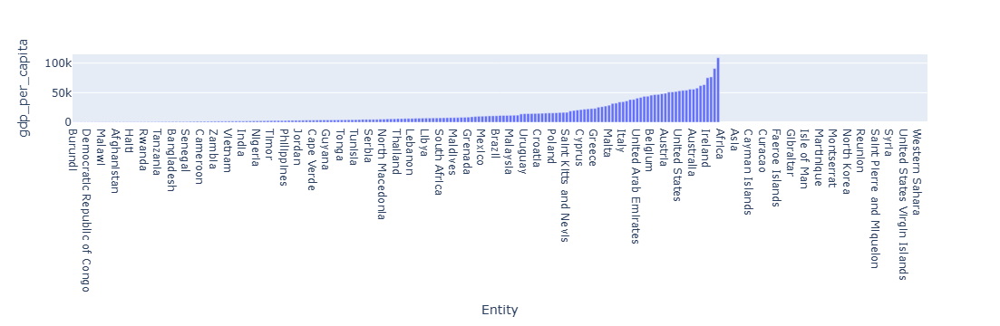

In [18]:
# or visually...
px.bar(gdp_and_pop_2017.sort_values("gdp_per_capita"), x = "Entity", y = "gdp_per_capita")

In [19]:
# We want to have not just 2017 gdps per capita, but all gdps per capita for every entity in every year.

In [20]:
# this isn't quite what we want, note the huge number of rows and generally weird behavior.
gdp_and_pop = pd.merge(left = gdp, right = pop, left_on = "Entity", right_on = "Entity", how = "inner")
gdp_and_pop
# We have duplicate entity values, which means we are seeing all possible combinations.出现多行

,Entity,Code_x,Year_x,GDP (constant 2010 US$),gdp,Code_y,Year_y,population
0,Afghanistan,AFG,2002,8.013233e+09,8.013233,AFG,1800,3280000
1,Afghanistan,AFG,2002,8.013233e+09,8.013233,AFG,1801,3280000
2,Afghanistan,AFG,2002,8.013233e+09,8.013233,AFG,1802,3280000
3,Afghanistan,AFG,2002,8.013233e+09,8.013233,AFG,1803,3280000
4,Afghanistan,AFG,2002,8.013233e+09,8.013233,AFG,1804,3280000
...,...,...,...,...,...,...,...,...
1904165,Zimbabwe,ZWE,2017,1.532981e+10,15.329811,ZWE,2015,13815000
1904166,Zimbabwe,ZWE,2017,1.532981e+10,15.329811,ZWE,2016,14030000
1904167,Zimbabwe,ZWE,2017,1.532981e+10,15.329811,ZWE,2017,14237000
1904168,Zimbabwe,ZWE,2017,1.532981e+10,15.329811,ZWE,2018,14439000


In [21]:
gdp_and_pop.query("Entity == 'Afghanistan'")

,Entity,Code_x,Year_x,GDP (constant 2010 US$),gdp,Code_y,Year_y,population
0,Afghanistan,AFG,2002,8.013233e+09,8.013233,AFG,1800,3280000
1,Afghanistan,AFG,2002,8.013233e+09,8.013233,AFG,1801,3280000
2,Afghanistan,AFG,2002,8.013233e+09,8.013233,AFG,1802,3280000
3,Afghanistan,AFG,2002,8.013233e+09,8.013233,AFG,1803,3280000
4,Afghanistan,AFG,2002,8.013233e+09,8.013233,AFG,1804,3280000
...,...,...,...,...,...,...,...,...
3515,Afghanistan,AFG,2017,2.196941e+10,21.969414,AFG,2015,34414000
3516,Afghanistan,AFG,2017,2.196941e+10,21.969414,AFG,2016,35383000
3517,Afghanistan,AFG,2017,2.196941e+10,21.969414,AFG,2017,36296000
3518,Afghanistan,AFG,2017,2.196941e+10,21.969414,AFG,2018,37172000


In [22]:
# Solution: We need to join the entity and the year
# Let's modify our code so that we're joining not just on Entity, but also the Year
gdp_and_pop = pd.merge(left = gdp, right = pop, left_on = ["Entity","Year"], right_on = ["Entity", "Year"], how = "left")

In [23]:
# compute the per capita gdp for every country in every year
gdp_and_pop["gdp_per_capita"] = gdp_and_pop["GDP (constant 2010 US$)"] / gdp_and_pop["population"]

In [24]:
gdp_and_pop

,Entity,Code_x,Year,GDP (constant 2010 US$),gdp,Code_y,population,gdp_per_capita
0,Afghanistan,AFG,2002,8.013233e+09,8.013233,AFG,22601000.0,354.552149
1,Afghanistan,AFG,2003,8.689884e+09,8.689884,AFG,23681000.0,366.955940
2,Afghanistan,AFG,2004,8.781610e+09,8.781610,AFG,24727000.0,355.142564
3,Afghanistan,AFG,2005,9.762979e+09,9.762979,AFG,25654000.0,380.563610
4,Afghanistan,AFG,2006,1.030523e+10,10.305228,AFG,26433000.0,389.862222
...,...,...,...,...,...,...,...,...
8864,Zimbabwe,ZWE,2013,1.418193e+10,14.181927,ZWE,13350000.0,1062.316603
8865,Zimbabwe,ZWE,2014,1.448359e+10,14.483588,ZWE,13587000.0,1065.988675
8866,Zimbabwe,ZWE,2015,1.472830e+10,14.728302,ZWE,13815000.0,1066.109450
8867,Zimbabwe,ZWE,2016,1.481899e+10,14.818986,ZWE,14030000.0,1056.235654


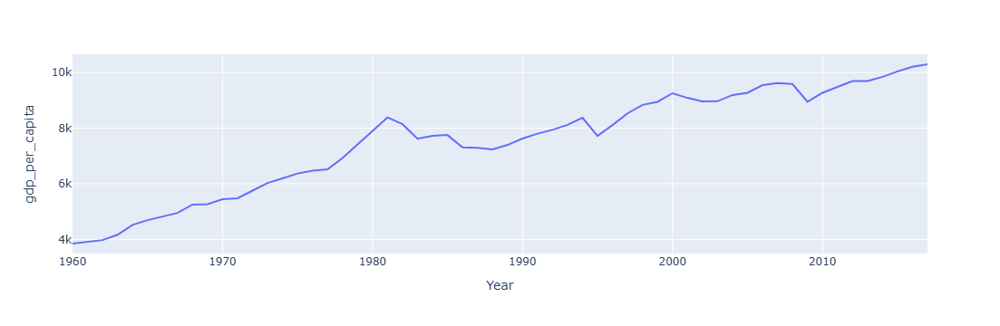

In [25]:
# plot various countries, and eventually plot AI countries.
px.line(gdp_and_pop.query('Entity == "Mexico"'), x = "Year", y = "gdp_per_capita")

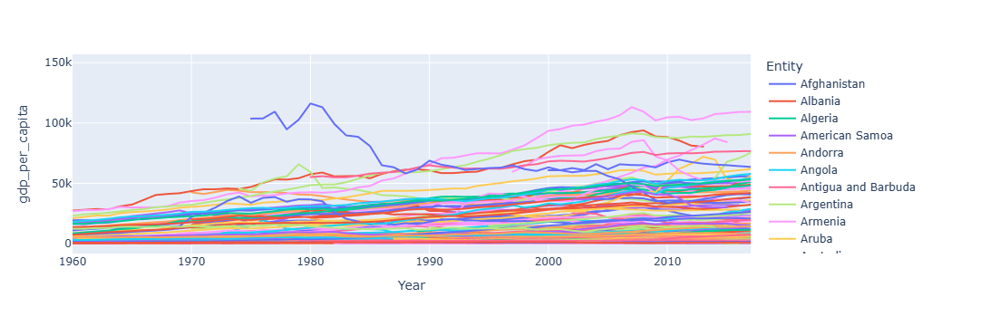

In [26]:
# All countries
px.line(gdp_and_pop, x = "Year", y = "gdp_per_capita", color = "Entity")

In [27]:
# Now let's try to get how much each economy has grown since 1960

In [28]:
# first we'll set our table up to be indexed by entity
gdp_and_pop_by_entity = gdp_and_pop.set_index("Entity")
# set the entity as the table's index
gdp_and_pop_by_entity
# Create a temporary dataframe and use it as a denominator

,Code_x,Year,GDP (constant 2010 US$),gdp,Code_y,population,gdp_per_capita
Entity,,,,,,,
Afghanistan,AFG,2002,8.013233e+09,8.013233,AFG,22601000.0,354.552149
Afghanistan,AFG,2003,8.689884e+09,8.689884,AFG,23681000.0,366.955940
Afghanistan,AFG,2004,8.781610e+09,8.781610,AFG,24727000.0,355.142564
Afghanistan,AFG,2005,9.762979e+09,9.762979,AFG,25654000.0,380.563610
Afghanistan,AFG,2006,1.030523e+10,10.305228,AFG,26433000.0,389.862222
...,...,...,...,...,...,...,...
Zimbabwe,ZWE,2013,1.418193e+10,14.181927,ZWE,13350000.0,1062.316603
Zimbabwe,ZWE,2014,1.448359e+10,14.483588,ZWE,13587000.0,1065.988675
Zimbabwe,ZWE,2015,1.472830e+10,14.728302,ZWE,13815000.0,1066.109450


In [29]:
# Then we'll create a temporary 1960 dataframe as we saw in an earlier module
gdp_per_capita_1960 = gdp_and_pop_by_entity.query("Year == 1960")[["gdp_per_capita"]]
gdp_per_capita_1960

,gdp_per_capita
Entity,
Algeria,2480.954892
Argentina,5642.704253
Australia,19452.581069
Austria,12987.795692
Bahamas,17659.437251
...,...
United States,16484.868935
Uruguay,5473.869009
Venezuela,12456.963693


In [30]:
# Then we'll just divide these
gdp_and_pop_by_entity["gdp_per_cap_ratio"] = gdp_and_pop_by_entity["gdp_per_capita"] / gdp_per_capita_1960["gdp_per_capita"]
gdp_and_pop_by_entity
# 各年/1960

,Code_x,Year,GDP (constant 2010 US$),gdp,Code_y,population,gdp_per_capita,gdp_per_cap_ratio
Entity,,,,,,,,
Afghanistan,AFG,2002,8.013233e+09,8.013233,AFG,22601000.0,354.552149,NaN
Afghanistan,AFG,2003,8.689884e+09,8.689884,AFG,23681000.0,366.955940,NaN
Afghanistan,AFG,2004,8.781610e+09,8.781610,AFG,24727000.0,355.142564,NaN
Afghanistan,AFG,2005,9.762979e+09,9.762979,AFG,25654000.0,380.563610,NaN
Afghanistan,AFG,2006,1.030523e+10,10.305228,AFG,26433000.0,389.862222,NaN
...,...,...,...,...,...,...,...,...
Zimbabwe,ZWE,2013,1.418193e+10,14.181927,ZWE,13350000.0,1062.316603,1.192968
Zimbabwe,ZWE,2014,1.448359e+10,14.483588,ZWE,13587000.0,1065.988675,1.197091
Zimbabwe,ZWE,2015,1.472830e+10,14.728302,ZWE,13815000.0,1066.109450,1.197227


In [31]:
# Then reset our index so we can plot
gdp_and_pop = gdp_and_pop_by_entity.reset_index()
gdp_and_pop

,Entity,Code_x,Year,GDP (constant 2010 US$),gdp,Code_y,population,gdp_per_capita,gdp_per_cap_ratio
0,Afghanistan,AFG,2002,8.013233e+09,8.013233,AFG,22601000.0,354.552149,NaN
1,Afghanistan,AFG,2003,8.689884e+09,8.689884,AFG,23681000.0,366.955940,NaN
2,Afghanistan,AFG,2004,8.781610e+09,8.781610,AFG,24727000.0,355.142564,NaN
3,Afghanistan,AFG,2005,9.762979e+09,9.762979,AFG,25654000.0,380.563610,NaN
4,Afghanistan,AFG,2006,1.030523e+10,10.305228,AFG,26433000.0,389.862222,NaN
...,...,...,...,...,...,...,...,...,...
8864,Zimbabwe,ZWE,2013,1.418193e+10,14.181927,ZWE,13350000.0,1062.316603,1.192968
8865,Zimbabwe,ZWE,2014,1.448359e+10,14.483588,ZWE,13587000.0,1065.988675,1.197091
8866,Zimbabwe,ZWE,2015,1.472830e+10,14.728302,ZWE,13815000.0,1066.109450,1.197227
8867,Zimbabwe,ZWE,2016,1.481899e+10,14.818986,ZWE,14030000.0,1056.235654,1.186139


In [32]:
# Then also drop the null rows
gdp_per_cap_ratio_history = gdp_and_pop.dropna()

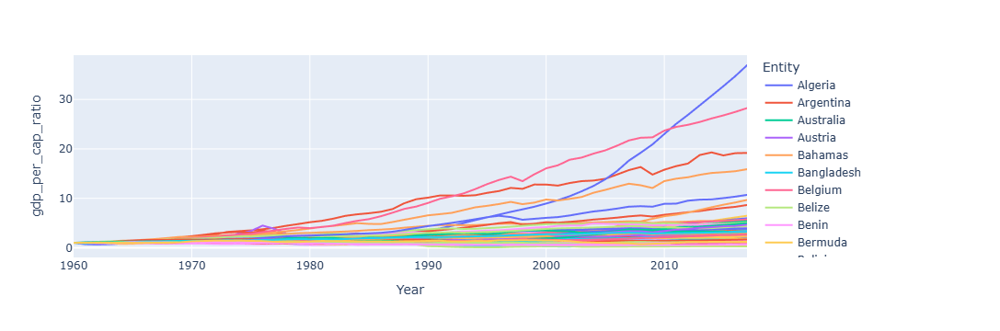

In [33]:
# now we can finally plot
px.line(gdp_per_cap_ratio_history, x = "Year", y = "gdp_per_cap_ratio", color = "Entity")

In [34]:
# Scatterplots of GDP and Population

In [35]:
# the code below adds a new gdp_ratio and a new pop_ratio
# in the end we will have 3 different ratios
gdp_and_pop_by_entity = gdp_per_cap_ratio_history.set_index("Entity")
gdp_and_pop_by_entity["pop_ratio"] = gdp_and_pop_by_entity["population"] / (gdp_and_pop_by_entity.query("Year == 1960")[["population"]]["population"])

# gdp_per_capita_1960 = gdp_and_pop_by_entity.query("Year == 1960")[["gdp_per_capita"]]
# gdp_and_pop_by_entity["gdp_per_cap_ratio"] = gdp_and_pop_by_entity["gdp_per_capita"] / gdp_per_capita_1960["gdp_per_capita"]

gdp_and_pop_by_entity["gdp_ratio"] = gdp_and_pop_by_entity["gdp"] / (gdp_and_pop_by_entity.query("Year == 1960")[["gdp"]]["gdp"])
gdp_and_pop = gdp_and_pop_by_entity.reset_index()

In [36]:
# let's reflect on what these 3 ratios mean
gdp_and_pop

,Entity,Code_x,Year,GDP (constant 2010 US$),gdp,Code_y,population,gdp_per_capita,gdp_per_cap_ratio,pop_ratio,gdp_ratio
0,Algeria,DZA,1960,2.743440e+10,27.434399,DZA,11058000.0,2480.954892,1.000000,1.000000,1.000000
1,Algeria,DZA,1961,2.370183e+10,23.701828,DZA,11336000.0,2090.845811,0.842758,1.025140,0.863946
2,Algeria,DZA,1962,1.903611e+10,19.036113,DZA,11620000.0,1638.219736,0.660318,1.050823,0.693878
3,Algeria,DZA,1963,2.556811e+10,25.568114,DZA,11913000.0,2146.236350,0.865085,1.077320,0.931973
4,Algeria,DZA,1964,2.706114e+10,27.061141,DZA,12222000.0,2214.133643,0.892452,1.105263,0.986395
...,...,...,...,...,...,...,...,...,...,...,...
5207,Zimbabwe,ZWE,2013,1.418193e+10,14.181927,ZWE,13350000.0,1062.316603,1.192968,3.534551,4.216605
5208,Zimbabwe,ZWE,2014,1.448359e+10,14.483588,ZWE,13587000.0,1065.988675,1.197091,3.597299,4.306296
5209,Zimbabwe,ZWE,2015,1.472830e+10,14.728302,ZWE,13815000.0,1066.109450,1.197227,3.657665,4.379055
5210,Zimbabwe,ZWE,2016,1.481899e+10,14.818986,ZWE,14030000.0,1056.235654,1.186139,3.714588,4.406017


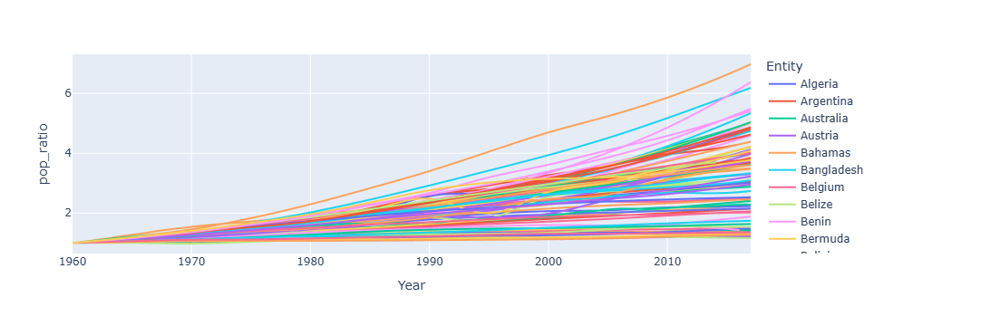

In [37]:
# let's explore population trends
px.line(gdp_and_pop, x = "Year", y = "pop_ratio", color = "Entity")

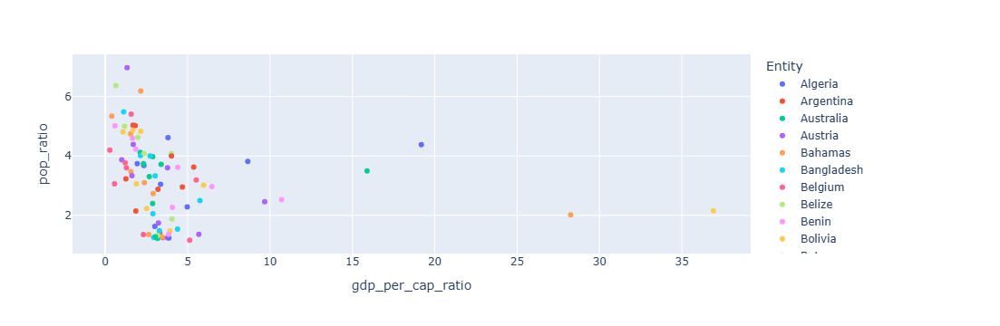

In [38]:
# now let's create a scatterplot of gdp_per_cap_ratio on x, pop_ratio on y for the year 2017.
px.scatter(gdp_and_pop.query("Year == 2017"), x = "gdp_per_cap_ratio", y = "pop_ratio", color = "Entity")

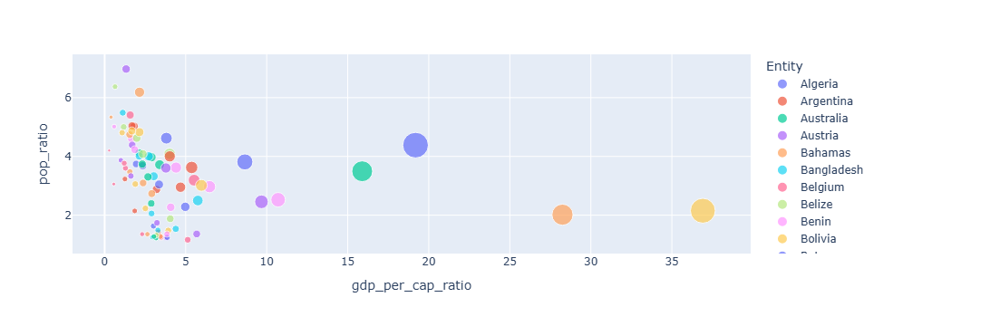

In [39]:
# same as above, but now let's size each market by the gdp_ratio.
# Then let's refelct on the story the data tells.
px.scatter(gdp_and_pop.query("Year == 2017"), x = "gdp_per_cap_ratio", y = "pop_ratio", color = "Entity", size = "gdp_ratio")

In [40]:
# adding Life Expectancy Data, Logarithmic Axes

In [41]:
# read life expetancy data
life_exp = pd.read_csv(r'C:\Users\liliz\OneDrive\Desktop\AI and ML\Berkeley Certificate\Module 4\video_assets_starter\DataSets\life_expectancy.csv')
life_exp

,Entity,Code,Year,Life expectancy
0,Afghanistan,AFG,1950,27.638
1,Afghanistan,AFG,1951,27.878
2,Afghanistan,AFG,1952,28.361
3,Afghanistan,AFG,1953,28.852
4,Afghanistan,AFG,1954,29.350
...,...,...,...,...
18440,Zimbabwe,ZWE,2015,59.534
18441,Zimbabwe,ZWE,2016,60.294
18442,Zimbabwe,ZWE,2017,60.812
18443,Zimbabwe,ZWE,2018,61.195


In [42]:
# ignore that Code column
life_exp = life_exp[["Entity","Year","Life expectancy"]]

In [43]:
# left join the tables
gdp_pop_le = pd.merge(left = gdp_and_pop, right = life_exp, left_on = ["Entity", "Year"], right_on = ["Entity", "Year"], how = "left")


In [44]:
# examine and reflect on the data
gdp_pop_le

,Entity,Code_x,Year,GDP (constant 2010 US$),gdp,Code_y,population,gdp_per_capita,gdp_per_cap_ratio,pop_ratio,gdp_ratio,Life expectancy
0,Algeria,DZA,1960,2.743440e+10,27.434399,DZA,11058000.0,2480.954892,1.000000,1.000000,1.000000,46.141
1,Algeria,DZA,1961,2.370183e+10,23.701828,DZA,11336000.0,2090.845811,0.842758,1.025140,0.863946,46.599
2,Algeria,DZA,1962,1.903611e+10,19.036113,DZA,11620000.0,1638.219736,0.660318,1.050823,0.693878,47.056
3,Algeria,DZA,1963,2.556811e+10,25.568114,DZA,11913000.0,2146.236350,0.865085,1.077320,0.931973,47.509
4,Algeria,DZA,1964,2.706114e+10,27.061141,DZA,12222000.0,2214.133643,0.892452,1.105263,0.986395,47.958
...,...,...,...,...,...,...,...,...,...,...,...,...
5207,Zimbabwe,ZWE,2013,1.418193e+10,14.181927,ZWE,13350000.0,1062.316603,1.192968,3.534551,4.216605,56.897
5208,Zimbabwe,ZWE,2014,1.448359e+10,14.483588,ZWE,13587000.0,1065.988675,1.197091,3.597299,4.306296,58.410
5209,Zimbabwe,ZWE,2015,1.472830e+10,14.728302,ZWE,13815000.0,1066.109450,1.197227,3.657665,4.379055,59.534
5210,Zimbabwe,ZWE,2016,1.481899e+10,14.818986,ZWE,14030000.0,1056.235654,1.186139,3.714588,4.406017,60.294


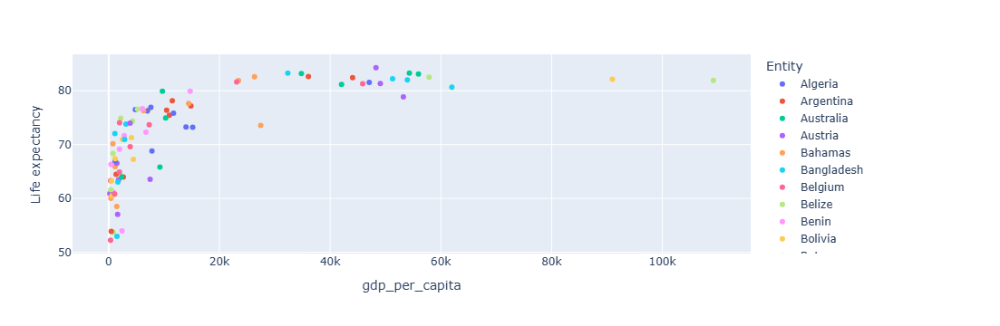

In [45]:
# Simple scatter plot
px.scatter(gdp_pop_le.query("Year == 2017"), x = "gdp_per_capita", y = "Life expectancy", color = "Entity")

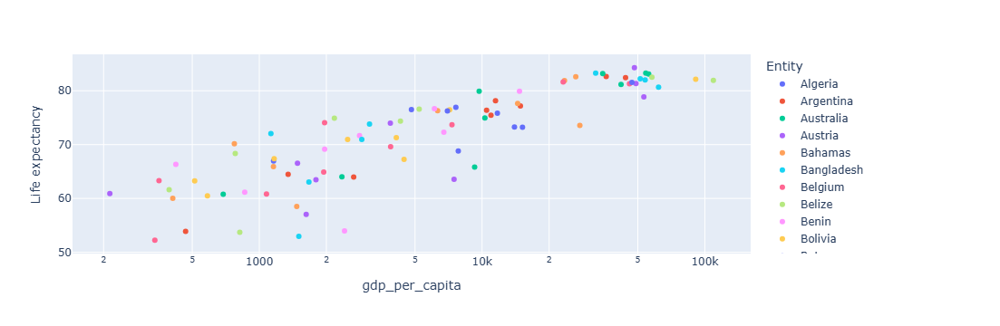

In [46]:
# show a logarithmic axis
# gdp_per_capita is on log scale
# shows linear relationship: suggests a model can be built and opens an interesting machine learning problem

px.scatter(gdp_pop_le.query("Year == 2017"), x = "gdp_per_capita", y = "Life expectancy", color = "Entity", log_x = True)

In [47]:
# Histograms, KDE Plots, Violin Plots, Box Plots

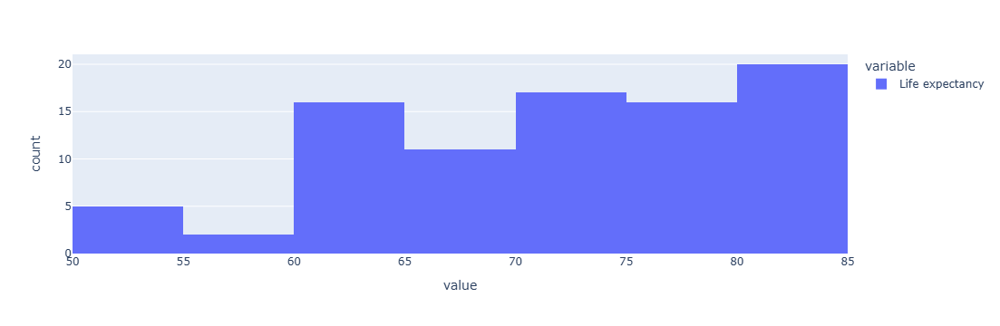

In [48]:
px.histogram(gdp_pop_le.query("Year == 2017")["Life expectancy"])

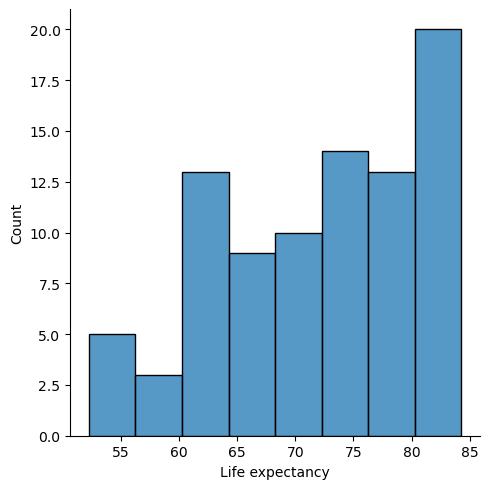

In [49]:
sns.displot(gdp_pop_le.query("Year == 2017")["Life expectancy"])

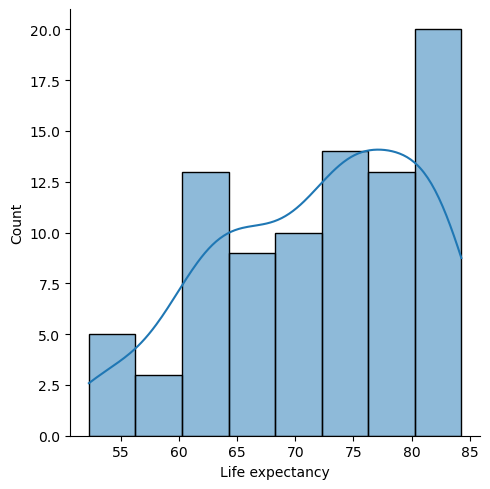

In [50]:
# same as above, but now with a kernel desity estimate (KDE)
sns.displot(gdp_pop_le.query("Year == 2017")["Life expectancy"], kde = True)

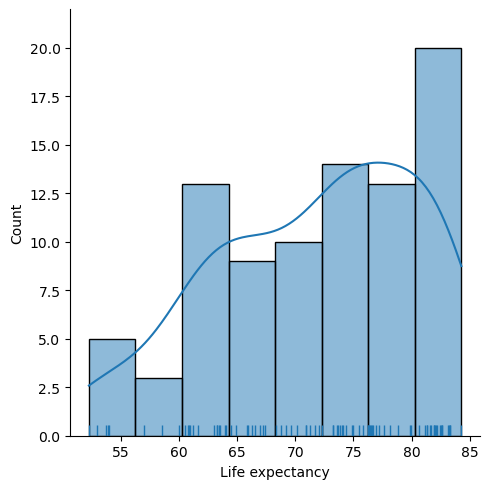

In [51]:
# now with a kde AND a rug plot
sns.displot(gdp_pop_le.query("Year == 2017")["Life expectancy"], kde = True, rug = True)

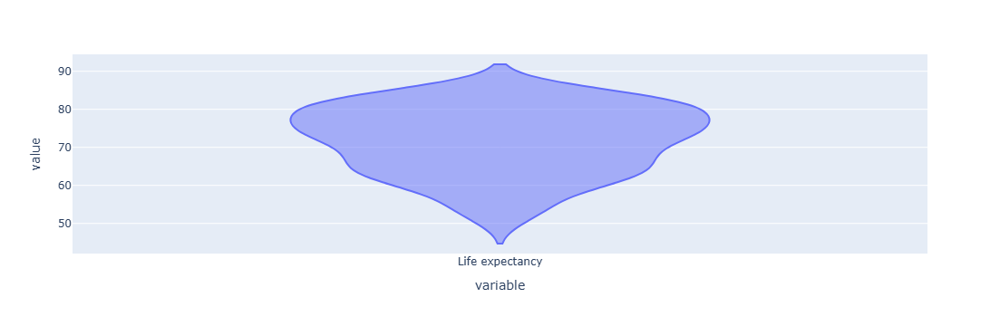

In [52]:
# basic violin plot, showing sidewise KDEs
px.violin(gdp_pop_le.query("Year == 2017")["Life expectancy"])

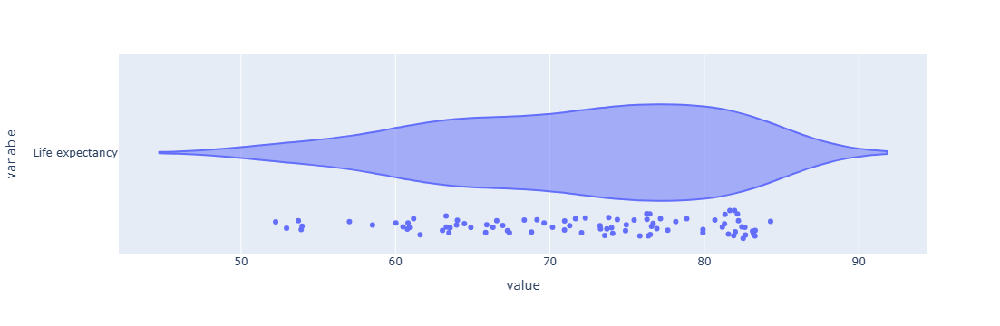

In [53]:
# adding points = "all" lets us see the data
px.violin(gdp_pop_le.query("Year == 2017"), ["Life expectancy"], points = "all")

In [54]:
# Create violin plots that are segmented by categories
continents = pd.read_csv(r'C:\Users\liliz\OneDrive\Desktop\AI and ML\Berkeley Certificate\Module 4\video_assets_starter\DataSets\continents.csv')
continents

,Country,Continent
0,Algeria,Africa
1,Angola,Africa
2,Benin,Africa
3,Botswana,Africa
4,Burkina Faso,Africa
...,...,...
197,Paraguay,South America
198,Peru,South America
199,Suriname,South America
200,Uruguay,South America


In [55]:
gdp_pop_le = pd.merge(left = gdp_pop_le, right = continents, left_on = "Entity", right_on = "Country", how = "left")

In [57]:
gdp_pop_le

,Entity,Code_x,Year,GDP (constant 2010 US$),gdp,Code_y,population,gdp_per_capita,gdp_per_cap_ratio,pop_ratio,gdp_ratio,Life expectancy,Country,Continent
0,Algeria,DZA,1960,2.743440e+10,27.434399,DZA,11058000.0,2480.954892,1.000000,1.000000,1.000000,46.141,Algeria,Africa
1,Algeria,DZA,1961,2.370183e+10,23.701828,DZA,11336000.0,2090.845811,0.842758,1.025140,0.863946,46.599,Algeria,Africa
2,Algeria,DZA,1962,1.903611e+10,19.036113,DZA,11620000.0,1638.219736,0.660318,1.050823,0.693878,47.056,Algeria,Africa
3,Algeria,DZA,1963,2.556811e+10,25.568114,DZA,11913000.0,2146.236350,0.865085,1.077320,0.931973,47.509,Algeria,Africa
4,Algeria,DZA,1964,2.706114e+10,27.061141,DZA,12222000.0,2214.133643,0.892452,1.105263,0.986395,47.958,Algeria,Africa
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5265,Zimbabwe,ZWE,2013,1.418193e+10,14.181927,ZWE,13350000.0,1062.316603,1.192968,3.534551,4.216605,56.897,Zimbabwe,Africa
5266,Zimbabwe,ZWE,2014,1.448359e+10,14.483588,ZWE,13587000.0,1065.988675,1.197091,3.597299,4.306296,58.410,Zimbabwe,Africa
5267,Zimbabwe,ZWE,2015,1.472830e+10,14.728302,ZWE,13815000.0,1066.109450,1.197227,3.657665,4.379055,59.534,Zimbabwe,Africa
5268,Zimbabwe,ZWE,2016,1.481899e+10,14.818986,ZWE,14030000.0,1056.235654,1.186139,3.714588,4.406017,60.294,Zimbabwe,Africa


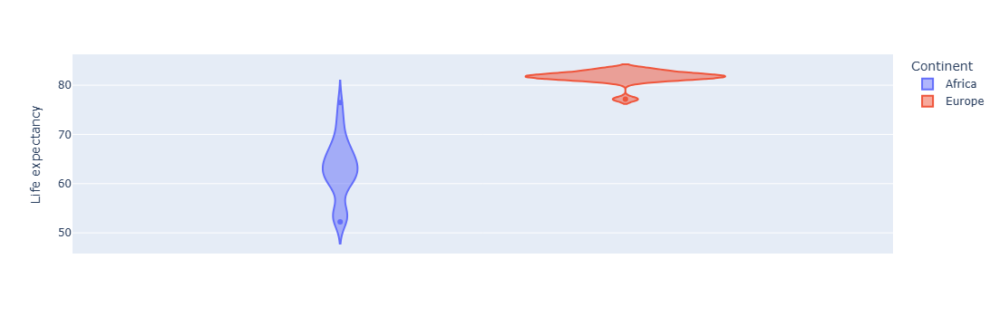

In [58]:
continents = ["Africa", "Europe"]
px.violin(gdp_pop_le.query("Year == 2017 and Continent in @continents").dropna(), y = "Life expectancy", color = "Continent")

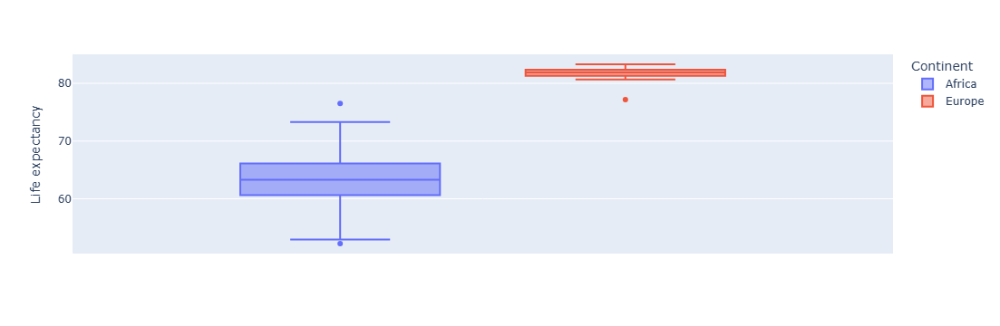

In [59]:
continents = ["Africa", "Europe"]
px.box(gdp_pop_le.query("Year == 2017 and Continent in @continents").dropna(), y = "Life expectancy", color = "Continent")

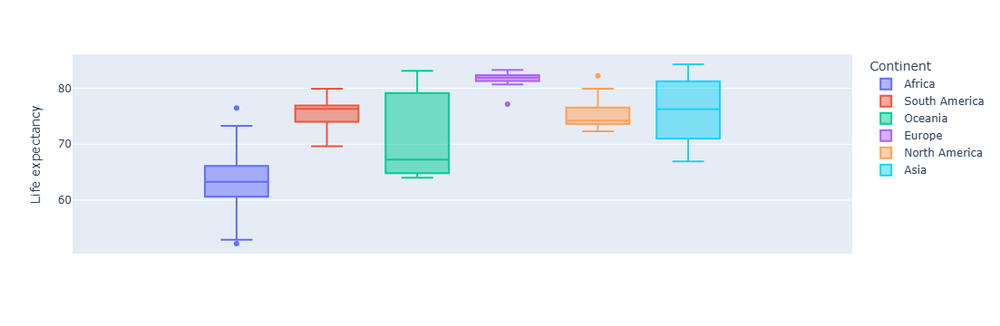

In [60]:
px.box(gdp_pop_le.query("Year == 2017").dropna(), y = "Life expectancy", color = "Continent")

In [61]:
# Marginal Plots and Joint Plots

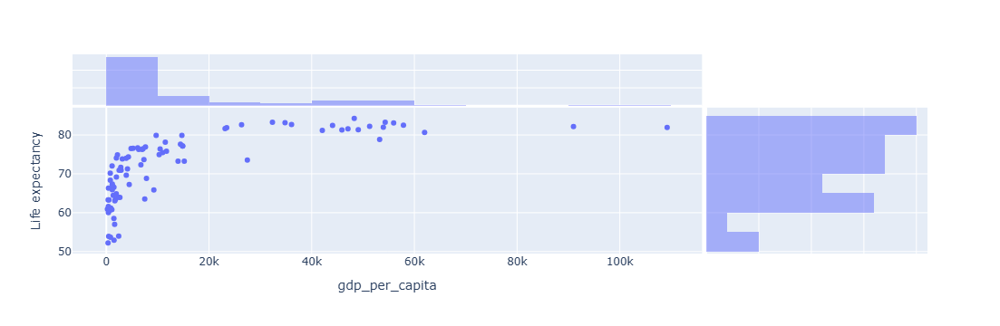

In [64]:
# cretae a mraginal plot on the y-axis and the x-axis
# get the marginal distribution of each of the variables
px.scatter(gdp_pop_le.query("Year == 2017"), x = "gdp_per_capita", y = "Life expectancy", marginal_y = "histogram", marginal_x = "histogram")

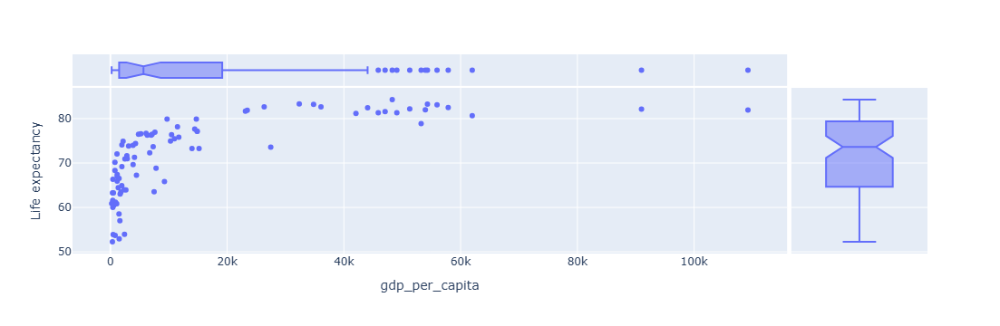

In [65]:
px.scatter(gdp_pop_le.query("Year == 2017"), x = "gdp_per_capita", y = "Life expectancy", marginal_y = "box", marginal_x = "box")

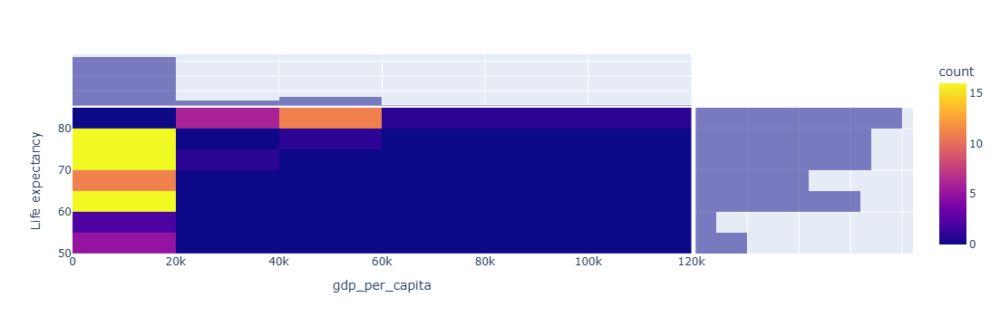

In [66]:
# get the density
px.density_heatmap(gdp_pop_le.query("Year == 2017"), x = "gdp_per_capita", y = "Life expectancy", marginal_y = "histogram", marginal_x = "histogram")

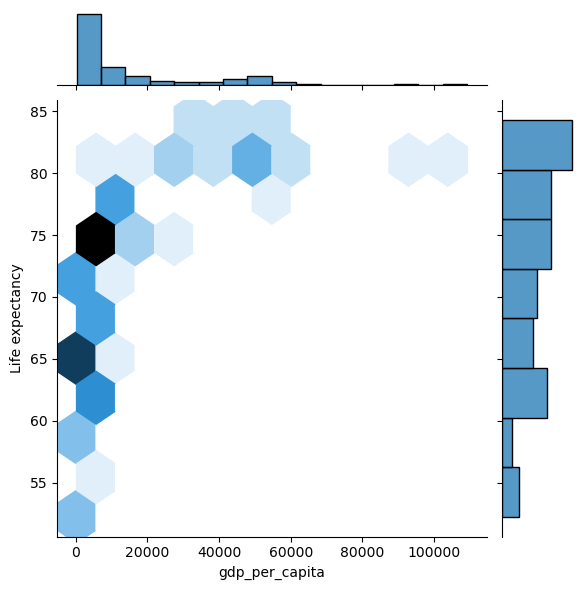

In [67]:
sns.jointplot(data = gdp_pop_le.query("Year == 2017"), x = "gdp_per_capita", y = "Life expectancy", kind = "hex")

In [68]:
# String Data

In [69]:
# show only entities whose name contains the substring "in"
gdp_pop_le[gdp_pop_le["Entity"].str.contains("in")]
# this is a birary of vectorized string functions.

,Entity,Code_x,Year,GDP (constant 2010 US$),gdp,Code_y,population,gdp_per_capita,gdp_per_cap_ratio,pop_ratio,gdp_ratio,Life expectancy,Country,Continent
58,Argentina,ARG,1960,1.155739e+11,115.573869,ARG,20482000.0,5642.704253,1.000000,1.000000,1.000000,65.055,Argentina,South America
59,Argentina,ARG,1961,1.218470e+11,121.847037,ARG,20817000.0,5853.246697,1.037312,1.016356,1.054278,65.176,Argentina,South America
60,Argentina,ARG,1962,1.208089e+11,120.808874,ARG,21153000.0,5711.193378,1.012138,1.032760,1.045296,65.269,Argentina,South America
61,Argentina,ARG,1963,1.143961e+11,114.396101,ARG,21489000.0,5323.472508,0.943426,1.049165,0.989809,65.348,Argentina,South America
62,Argentina,ARG,1964,1.259848e+11,125.984766,ARG,21824000.0,5772.762383,1.023049,1.065521,1.090080,65.426,Argentina,South America
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4978,United Kingdom,GBR,2013,2.564905e+12,2564.904713,GBR,64984000.0,39469.788151,2.852872,1.240839,3.539956,80.876,United Kingdom,Europe
4979,United Kingdom,GBR,2014,2.643243e+12,2643.243341,GBR,65423000.0,40402.356073,2.920278,1.249222,3.648075,80.978,United Kingdom,Europe
4980,United Kingdom,GBR,2015,2.705252e+12,2705.252231,GBR,65860000.0,41075.800659,2.968954,1.257566,3.733657,81.052,United Kingdom,Europe
4981,United Kingdom,GBR,2016,2.757620e+12,2757.620259,GBR,66298000.0,41594.320481,3.006433,1.265930,3.805933,81.111,United Kingdom,Europe


In [70]:
# get only entities whose name starts with B
gdp_pop_le[gdp_pop_le["Entity"].str.startswith("B")]

,Entity,Code_x,Year,GDP (constant 2010 US$),gdp,Code_y,population,gdp_per_capita,gdp_per_cap_ratio,pop_ratio,gdp_ratio,Life expectancy,Country,Continent
232,Bahamas,BHS,1960,1.942538e+09,1.942538,BHS,110000.0,17659.437251,1.000000,1.000000,1.000000,64.740,Bahamas,North America
233,Bahamas,BHS,1961,2.149751e+09,2.149751,BHS,115000.0,18693.482862,1.058555,1.045455,1.106671,64.885,Bahamas,North America
234,Bahamas,BHS,1962,2.374442e+09,2.374442,BHS,121000.0,19623.486365,1.111218,1.100000,1.222340,65.011,Bahamas,North America
235,Bahamas,BHS,1963,2.624329e+09,2.624329,BHS,127000.0,20664.011191,1.170140,1.154545,1.350980,65.121,Bahamas,North America
236,Bahamas,BHS,1964,2.899925e+09,2.899925,BHS,134000.0,21641.232380,1.225477,1.218182,1.492854,65.219,Bahamas,North America
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
861,Burundi,BDI,2013,2.297623e+09,2.297623,BDI,9540000.0,240.840958,1.129507,3.409578,3.851141,59.148,Burundi,Africa
862,Burundi,BDI,2014,2.404713e+09,2.404713,BDI,9844000.0,244.282107,1.145645,3.518227,4.030640,59.665,Burundi,Africa
863,Burundi,BDI,2015,2.310421e+09,2.310421,BDI,10160000.0,227.403625,1.066488,3.631165,3.872593,60.123,Burundi,Africa
864,Burundi,BDI,2016,2.297241e+09,2.297241,BDI,10488000.0,219.035220,1.027241,3.748392,3.850502,60.528,Burundi,Africa


In [71]:
# convert all entity values into upper case
gdp_pop_le["Entity"].str.upper()
# Note that .str.contains() supports arbitrary strings

0        ALGERIA
1        ALGERIA
2        ALGERIA
3        ALGERIA
4        ALGERIA
          ...   
5265    ZIMBABWE
5266    ZIMBABWE
5267    ZIMBABWE
5268    ZIMBABWE
5269    ZIMBABWE
Name: Entity, Length: 5270, dtype: object

In [72]:
gdp_pop_le[gdp_pop_le["Entity"].str.contains(" ")]

,Entity,Code_x,Year,GDP (constant 2010 US$),gdp,Code_y,population,gdp_per_capita,gdp_per_cap_ratio,pop_ratio,gdp_ratio,Life expectancy,Country,Continent
750,Burkina Faso,BFA,1960,1.153497e+09,1.153497,BFA,4829000.0,238.868808,1.000000,1.000000,1.000000,34.432,Burkina Faso,Africa
751,Burkina Faso,BFA,1961,1.200144e+09,1.200144,BFA,4895000.0,245.177544,1.026411,1.013667,1.040439,34.897,Burkina Faso,Africa
752,Burkina Faso,BFA,1962,1.273698e+09,1.273698,BFA,4960000.0,256.794051,1.075042,1.027128,1.104206,35.369,Burkina Faso,Africa
753,Burkina Faso,BFA,1963,1.257548e+09,1.257548,BFA,5028000.0,250.108948,1.047056,1.041209,1.090204,35.847,Burkina Faso,Africa
754,Burkina Faso,BFA,1964,1.286255e+09,1.286255,BFA,5099000.0,252.256390,1.056046,1.055912,1.115092,36.331,Burkina Faso,Africa
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5036,United States,USA,2013,1.580286e+13,15802.855301,USA,316400992.0,49945.656622,3.029788,1.694512,5.134012,78.909,NaN,NaN
5037,United States,USA,2014,1.620886e+13,16208.861247,USA,318672992.0,50863.617735,3.085473,1.706680,5.265915,78.922,NaN,NaN
5038,United States,USA,2015,1.667269e+13,16672.691918,USA,320878016.0,51959.595505,3.151957,1.718489,5.416604,78.910,NaN,NaN
5039,United States,USA,2016,1.692033e+13,16920.327942,USA,323016000.0,52382.321439,3.177600,1.729939,5.497056,78.885,NaN,NaN


In [73]:
# Working with Real World String Data (Example)

In [75]:
# read indian_states.csv
df = pd.read_csv(r'C:\Users\liliz\OneDrive\Desktop\AI and ML\Berkeley Certificate\Module 4\video_assets_starter\DataSets\indian_states.csv')
df

,State,ISO 3166-2:IN,Vehiclecode,Zone,Capital,Largest city,Statehood,Population(census 2011)[citation needed],Area(km2),Officiallanguages[39],Additional officiallanguages[39]
0,Andhra Pradesh,IN-AP,AP,Southern,Visakhapatnam (Administrative)[40]Amaravati (L...,Visakhapatnam,1 November 1956,"49,506,799","160,205",Telugu,—
1,Arunachal Pradesh,IN-AR,AR,North-Eastern,Itanagar,Itanagar,20 February 1987,"1,383,727","83,743",English,—
2,Assam,IN-AS,AS,North-Eastern,Dispur,Guwahati,26 January 1950,"31,205,576","78,550",Assamese,"Bengali, Bodo"
3,Bihar,IN-BR,BR,Eastern,Patna,Patna,26 January 1950,"104,099,452","94,163",Hindi,Urdu
4,Chhattisgarh,IN-CT,CG,Central,Nava Raipur,Raipur,1 November 2000,"25,545,198","135,194",Hindi,Chhattisgarhi
...,...,...,...,...,...,...,...,...,...,...,...
23,Telangana,IN-TG,TS,Southern,Hyderabad[b],Hyderabad[b],2 June 2014,"35,193,978[48]","114,840[48]",Telugu,Urdu[49]
24,Tripura,IN-TR,TR,North-Eastern,Agartala,Agartala,21 January 1972,"3,673,917","10,492","Bengali, English, Kokborok",—
25,Uttar Pradesh,IN-UP,UP,Central,Lucknow,Kanpur,26 January 1950,"199,812,341","243,286",Hindi,Urdu
26,Uttarakhand,IN-UT,UK,Central,Gairsain (Summer)Dehradun (Winter)[50],Dehradun,9 November 2000,"10,086,292","53,483",Hindi,Sanskrit[51]


In [76]:
# rename weired column names
df = df.rename(columns = {"Officiallanguages[39]": "official", "Additional officiallanguages[39]": "other", "Population(census 2011)[citation needed]": "population"})

In [77]:
df

,State,ISO 3166-2:IN,Vehiclecode,Zone,Capital,Largest city,Statehood,population,Area(km2),official,other
0,Andhra Pradesh,IN-AP,AP,Southern,Visakhapatnam (Administrative)[40]Amaravati (L...,Visakhapatnam,1 November 1956,"49,506,799","160,205",Telugu,—
1,Arunachal Pradesh,IN-AR,AR,North-Eastern,Itanagar,Itanagar,20 February 1987,"1,383,727","83,743",English,—
2,Assam,IN-AS,AS,North-Eastern,Dispur,Guwahati,26 January 1950,"31,205,576","78,550",Assamese,"Bengali, Bodo"
3,Bihar,IN-BR,BR,Eastern,Patna,Patna,26 January 1950,"104,099,452","94,163",Hindi,Urdu
4,Chhattisgarh,IN-CT,CG,Central,Nava Raipur,Raipur,1 November 2000,"25,545,198","135,194",Hindi,Chhattisgarhi
...,...,...,...,...,...,...,...,...,...,...,...
23,Telangana,IN-TG,TS,Southern,Hyderabad[b],Hyderabad[b],2 June 2014,"35,193,978[48]","114,840[48]",Telugu,Urdu[49]
24,Tripura,IN-TR,TR,North-Eastern,Agartala,Agartala,21 January 1972,"3,673,917","10,492","Bengali, English, Kokborok",—
25,Uttar Pradesh,IN-UP,UP,Central,Lucknow,Kanpur,26 January 1950,"199,812,341","243,286",Hindi,Urdu
26,Uttarakhand,IN-UT,UK,Central,Gairsain (Summer)Dehradun (Winter)[50],Dehradun,9 November 2000,"10,086,292","53,483",Hindi,Sanskrit[51]


In [84]:
# get only states that speak Telegu officially or unofficially
telugu_states = df[(df["official"].str.contains("Telugu")) | (df["other"].str.contains("Telugu"))]

In [85]:
telugu_states

,State,ISO 3166-2:IN,Vehiclecode,Zone,Capital,Largest city,Statehood,population,Area(km2),official,other
0,Andhra Pradesh,IN-AP,AP,Southern,Visakhapatnam (Administrative)[40]Amaravati (L...,Visakhapatnam,1 November 1956,"49,506,799","160,205",Telugu,—
23,Telangana,IN-TG,TS,Southern,Hyderabad[b],Hyderabad[b],2 June 2014,"35,193,978[48]","114,840[48]",Telugu,Urdu[49]
27,West Bengal,IN-WB,WB,Eastern,Kolkata,Kolkata,26 January 1950,"91,276,115","88,752","Bengali, Nepali[c]","Hindi, Odia, Telugu, Punjabi, Santali, Urdu"


In [86]:
# try to sum Telugu population using sum
telugu_states["population"].sum()

'49,506,79935,193,978[48]91,276,115'

In [87]:
# check types
df.dtypes

State            object
ISO 3166-2:IN    object
Vehiclecode      object
Zone             object
Capital          object
                  ...  
Statehood        object
population       object
Area(km2)        object
official         object
other            object
Length: 11, dtype: object

In [ ]:
# I want the population not to be object, but merical type
# Every column is annotated with the type of data it contains
# I want to convert the column "population" into numbers.
# try to convert to numberic
pd.to_numeric(df["population"])
# The function pd.to_numeric() converts tables or columns from non-numeric to numeric.
# The function pd.to_numeric() does not understand how to handle commas. 

In [88]:
# get rid of commas using str.replace
df["population"] = df["population"].str.replace(",","")

In [89]:
df


,State,ISO 3166-2:IN,Vehiclecode,Zone,Capital,Largest city,Statehood,population,Area(km2),official,other
0,Andhra Pradesh,IN-AP,AP,Southern,Visakhapatnam (Administrative)[40]Amaravati (L...,Visakhapatnam,1 November 1956,49506799,"160,205",Telugu,—
1,Arunachal Pradesh,IN-AR,AR,North-Eastern,Itanagar,Itanagar,20 February 1987,1383727,"83,743",English,—
2,Assam,IN-AS,AS,North-Eastern,Dispur,Guwahati,26 January 1950,31205576,"78,550",Assamese,"Bengali, Bodo"
3,Bihar,IN-BR,BR,Eastern,Patna,Patna,26 January 1950,104099452,"94,163",Hindi,Urdu
4,Chhattisgarh,IN-CT,CG,Central,Nava Raipur,Raipur,1 November 2000,25545198,"135,194",Hindi,Chhattisgarhi
...,...,...,...,...,...,...,...,...,...,...,...
23,Telangana,IN-TG,TS,Southern,Hyderabad[b],Hyderabad[b],2 June 2014,35193978[48],"114,840[48]",Telugu,Urdu[49]
24,Tripura,IN-TR,TR,North-Eastern,Agartala,Agartala,21 January 1972,3673917,"10,492","Bengali, English, Kokborok",—
25,Uttar Pradesh,IN-UP,UP,Central,Lucknow,Kanpur,26 January 1950,199812341,"243,286",Hindi,Urdu
26,Uttarakhand,IN-UT,UK,Central,Gairsain (Summer)Dehradun (Winter)[50],Dehradun,9 November 2000,10086292,"53,483",Hindi,Sanskrit[51]


In [ ]:
# try again, it fails agian
pd.to_numberic(df["population"])
# The function pd.to_numeric() does not understand what to do with the numbers in brackets.

In [90]:
# get rid of the weird bracketed number using str.replace
df["population"].str.replace("[48]", "")

0      49506799
1       1383727
2      31205576
3     104099452
4      25545198
        ...    
23     35193978
24      3673917
25    199812341
26     10086292
27     91276115
Name: population, Length: 28, dtype: object

In [92]:
# get rid of the weird bracketed number using str.replace
df["population"].str.replace("\[48\]", "")


<>:2: SyntaxWarning:

invalid escape sequence '\['

<>:2: SyntaxWarning:

invalid escape sequence '\['

C:\Users\liliz\AppData\Local\Temp\ipykernel_15308\3698803093.py:2: SyntaxWarning:

invalid escape sequence '\['



0         49506799
1          1383727
2         31205576
3        104099452
4         25545198
          ...     
23    35193978[48]
24         3673917
25       199812341
26        10086292
27        91276115
Name: population, Length: 28, dtype: object

In [93]:
df["population"] = df["population"].str.replace("[48]", "")

In [94]:
df

,State,ISO 3166-2:IN,Vehiclecode,Zone,Capital,Largest city,Statehood,population,Area(km2),official,other
0,Andhra Pradesh,IN-AP,AP,Southern,Visakhapatnam (Administrative)[40]Amaravati (L...,Visakhapatnam,1 November 1956,49506799,"160,205",Telugu,—
1,Arunachal Pradesh,IN-AR,AR,North-Eastern,Itanagar,Itanagar,20 February 1987,1383727,"83,743",English,—
2,Assam,IN-AS,AS,North-Eastern,Dispur,Guwahati,26 January 1950,31205576,"78,550",Assamese,"Bengali, Bodo"
3,Bihar,IN-BR,BR,Eastern,Patna,Patna,26 January 1950,104099452,"94,163",Hindi,Urdu
4,Chhattisgarh,IN-CT,CG,Central,Nava Raipur,Raipur,1 November 2000,25545198,"135,194",Hindi,Chhattisgarhi
...,...,...,...,...,...,...,...,...,...,...,...
23,Telangana,IN-TG,TS,Southern,Hyderabad[b],Hyderabad[b],2 June 2014,35193978,"114,840[48]",Telugu,Urdu[49]
24,Tripura,IN-TR,TR,North-Eastern,Agartala,Agartala,21 January 1972,3673917,"10,492","Bengali, English, Kokborok",—
25,Uttar Pradesh,IN-UP,UP,Central,Lucknow,Kanpur,26 January 1950,199812341,"243,286",Hindi,Urdu
26,Uttarakhand,IN-UT,UK,Central,Gairsain (Summer)Dehradun (Winter)[50],Dehradun,9 November 2000,10086292,"53,483",Hindi,Sanskrit[51]


In [99]:
# this time converting to numeric works!
pd.to_numeric(df["population"])
# dtype: int64

0      49506799
1       1383727
2      31205576
3     104099452
4      25545198
        ...    
23     35193978
24      3673917
25    199812341
26     10086292
27     91276115
Name: population, Length: 28, dtype: int64

In [96]:
df["population"] = pd.to_numeric(df["population"])

In [98]:
df.dtypes

State            object
ISO 3166-2:IN    object
Vehiclecode      object
Zone             object
Capital          object
                  ...  
Statehood        object
population        int64
Area(km2)        object
official         object
other            object
Length: 11, dtype: object

In [101]:
telugu_states = df[(df["other"].str.contains("Telugu")) | (df["official"].str.contains("Telugu"))]
telugu_states["population"].sum()

175976892